In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

In [2]:
uc = pd.read_csv('vehicles.csv')

In [3]:
uc.shape

(426880, 26)

In [4]:
uc.head(5)

,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,...,size,type,paint_color,image_url,description,county,state,lat,long,posting_date
0,7222695916,https://prescott.craigslist.org/cto/d/prescott...,prescott,https://prescott.craigslist.org,6000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,az,NaN,NaN,NaN
1,7218891961,https://fayar.craigslist.org/ctd/d/bentonville...,fayetteville,https://fayar.craigslist.org,11900,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,ar,NaN,NaN,NaN
2,7221797935,https://keys.craigslist.org/cto/d/summerland-k...,florida keys,https://keys.craigslist.org,21000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,fl,NaN,NaN,NaN
3,7222270760,https://worcester.craigslist.org/cto/d/west-br...,worcester / central MA,https://worcester.craigslist.org,1500,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,ma,NaN,NaN,NaN
4,7210384030,https://greensboro.craigslist.org/cto/d/trinit...,greensboro,https://greensboro.craigslist.org,4900,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,nc,NaN,NaN,NaN


In [5]:
uc.describe()

,id,price,year,odometer,county,lat,long
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05,0.0,420331.000000,420331.000000
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04,NaN,38.493940,-94.748599
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05,NaN,5.841533,18.365462
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00,NaN,-84.122245,-159.827728
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04,NaN,34.601900,-111.939847
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04,NaN,39.150100,-88.432600
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05,NaN,42.398900,-80.832039
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07,NaN,82.390818,173.885502


In [6]:
uc.columns

Index(['id', 'url', 'region', 'region_url', 'price', 'year', 'manufacturer',
       'model', 'condition', 'cylinders', 'fuel', 'odometer', 'title_status',
       'transmission', 'VIN', 'drive', 'size', 'type', 'paint_color',
       'image_url', 'description', 'county', 'state', 'lat', 'long',
       'posting_date'],
      dtype='object')

In [7]:
nas = (uc.isna().sum()/len(uc)).sort_values(ascending=False)

In [8]:
nas

county          1.000000
size            0.717675
cylinders       0.416225
condition       0.407852
VIN             0.377254
drive           0.305863
paint_color     0.305011
type            0.217527
manufacturer    0.041337
title_status    0.019308
lat             0.015342
long            0.015342
model           0.012362
odometer        0.010307
fuel            0.007058
transmission    0.005988
year            0.002823
description     0.000164
image_url       0.000159
posting_date    0.000159
url             0.000000
price           0.000000
state           0.000000
region_url      0.000000
region          0.000000
id              0.000000
dtype: float64

In [9]:
uc.drop(columns = ['id','url','county','image_url','region_url','VIN','lat','long'],inplace=True)

In [10]:
uc['size'].unique()

array([nan, 'full-size', 'mid-size', 'compact', 'sub-compact'],
      dtype=object)

C:\Users\Axelrod\AppData\Roaming\Python\Python38\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


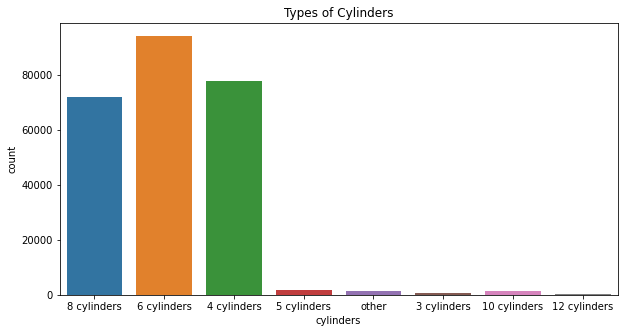

In [15]:
plt.figure(figsize=(10,5))
sns.countplot(uc['cylinders'])
plt.title('Types of Cylinders')
plt.savefig('Types of Cylinders')

C:\Users\Axelrod\AppData\Roaming\Python\Python38\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
No handles with labels found to put in legend.


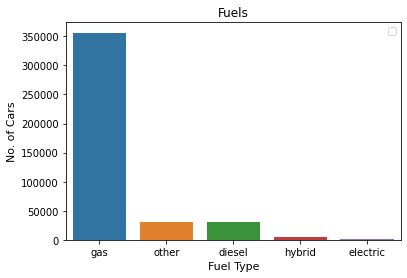

In [14]:
graph = sns.countplot(uc['fuel'])
graph.set_xlabel('Fuel Type',size=11)
graph.set_ylabel('No. of Cars',size=11)
plt.title('Fuels')
plt.legend()
plt.savefig('Fuels.png',dpi=300)

C:\Users\Axelrod\AppData\Roaming\Python\Python38\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


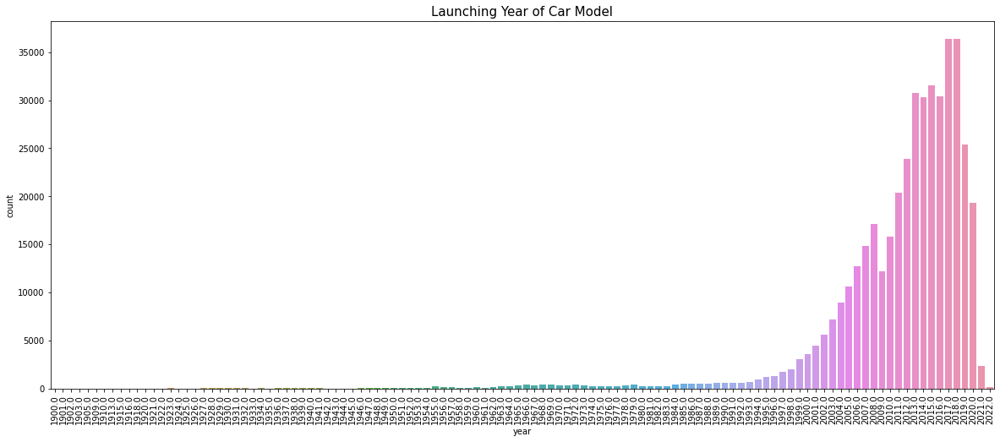

In [16]:
#what if this become a normal curve

plt.figure(figsize=(20,8))

ax = sns.countplot(uc['year'])
plt.title("Launching Year of Car Model",size=15)
k = ax.set_xticklabels(ax.get_xticklabels(),rotation=90,size=10)
plt.savefig('Launching Year of Car Model')

In [17]:
uc[uc['transmission'] == 'automatic']['transmission']

31        automatic
34        automatic
37        automatic
46        automatic
55        automatic
            ...    
426864    automatic
426866    automatic
426868    automatic
426873    automatic
426874    automatic
Name: transmission, Length: 336524, dtype: object

In [18]:
manufec_count = uc['manufacturer'].value_counts().sort_values(ascending=False).reset_index()
manufec_count.columns = ['manufacturer','count']
manufec_count.head(5)

,manufacturer,count
0,ford,70985
1,chevrolet,55064
2,toyota,34202
3,honda,21269
4,nissan,19067


In [19]:
mcount = uc[['manufacturer','transmission','year']].groupby(['transmission','year']).agg(['count'])
mcount.head(10)

manufacturer
                           count
transmission year               
automatic    1900.0            1
             1901.0            0
             1905.0            1
             1909.0            0
             1918.0            1
             1922.0            2
             1923.0           29
             1924.0            1
             1925.0            4
             1926.0           10

In [20]:
#mcount.columns = ['cyear','count']


In [21]:
#mcount['manufacturer count']

In [22]:
'''
trace0 = go.Bar(x = mcount['manufacturer'],
               y = mcount['count'],
               marker = dict(color = '#FF6F00')
               )
layout = go.Layout(title = 'Transmission')
fig = go.Figure(data = [trace0],layout = layout)
fig.show()
'''

"\ntrace0 = go.Bar(x = mcount['manufacturer'],\n               y = mcount['count'],\n               marker = dict(color = '#FF6F00')\n               )\nlayout = go.Layout(title = 'Transmission')\nfig = go.Figure(data = [trace0],layout = layout)\nfig.show()\n"

In [26]:

trace0 = go.Bar(x = manufec_count['manufacturer'],
                y = manufec_count['count'],
                marker = dict(color = '#FF6F00'),
                text = manufec_count['count']
)
trace1 = go.Bar(x =manufec_count['manufacturer'],
               y = uc['transmission'],
               marker = dict(color = '#F7DC6F')
               )

layout = go.Layout(title = 'Manufacturer')
fig = go.Figure(data = [trace0,trace1],layout = layout)
fig.show()


In [28]:
uc['transmission'].unique()

array([nan, 'other', 'automatic', 'manual'], dtype=object)

C:\Users\Axelrod\AppData\Roaming\Python\Python38\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



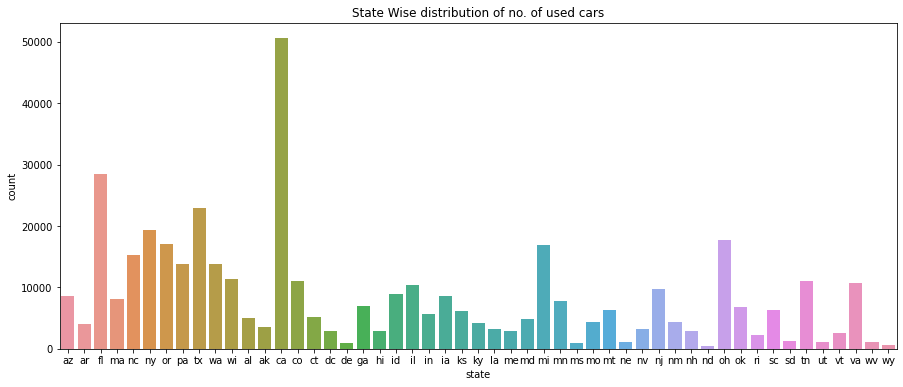

In [29]:
plt.figure(figsize=(15,6))
ax = sns.countplot(uc['state'])
plt.title("State Wise distribution of no. of used cars")
k = ax.set_xticklabels(ax.get_xticklabels(),size=10)

In [30]:
'''
plt.figure(figsize=(15,6))
color_labels = list(uc['paint_color'].unique())

rgb_values = sns.color_palette('Set1',6)
color_map = dict(zip(color_labels,rgb_values))
ax = sns.countplot(uc['paint_color'])
'''

"\nplt.figure(figsize=(15,6))\ncolor_labels = list(uc['paint_color'].unique())\n\nrgb_values = sns.color_palette('Set1',6)\ncolor_map = dict(zip(color_labels,rgb_values))\nax = sns.countplot(uc['paint_color'])\n"

C:\Users\Axelrod\AppData\Roaming\Python\Python38\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:title={'center':'Color count of Cars'}, xlabel='paint', ylabel='count'>

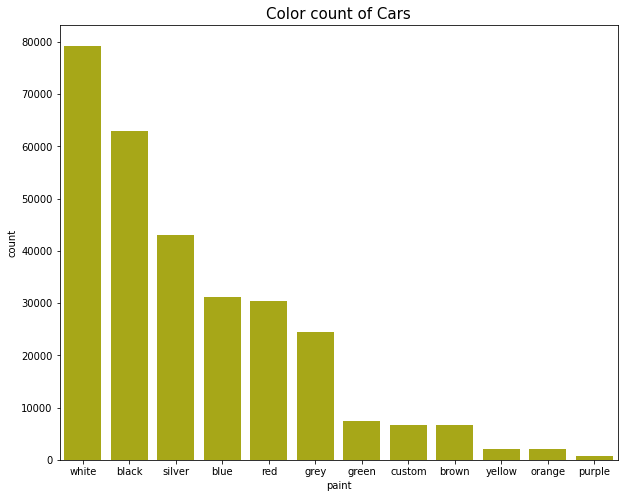

In [31]:
plt.figure(figsize=(10,8))
paint = uc['paint_color'].value_counts().reset_index()
paint.columns = ['paint','count']
'''
for i in paint['paint']:
    try:
        sns.barplot(paint['paint'],paint['count'],color =i[0])
    except:
        sns.barplot(paint['paint'],paint['count'],color = 'y')
'''
plt.title("Color count of Cars",size=15)
sns.barplot(paint['paint'],paint['count'],color = 'y')

In [32]:
transm = uc.groupby('manufacturer')['transmission'].value_counts()

In [33]:
trans = pd.DataFrame(transm)

In [34]:
trans.columns

Index(['transmission'], dtype='object')

In [35]:
trans = trans.unstack(level= 'transmission')
trans.head(5)

transmission               
transmission    automatic manual   other
manufacturer                            
acura              3534.0   82.0  2347.0
alfa-romeo          195.0   26.0   676.0
aston-martin         23.0    1.0     NaN
audi               5000.0  257.0  2286.0
bmw               11208.0  709.0  2751.0

In [36]:
trans[('transmission','automatic')].head(4)

manufacturer
acura           3534.0
alfa-romeo       195.0
aston-martin      23.0
audi            5000.0
Name: (transmission, automatic), dtype: float64

In [37]:
trans.index

Index(['acura', 'alfa-romeo', 'aston-martin', 'audi', 'bmw', 'buick',
       'cadillac', 'chevrolet', 'chrysler', 'datsun', 'dodge', 'ferrari',
       'fiat', 'ford', 'gmc', 'harley-davidson', 'honda', 'hyundai',
       'infiniti', 'jaguar', 'jeep', 'kia', 'land rover', 'lexus', 'lincoln',
       'mazda', 'mercedes-benz', 'mercury', 'mini', 'mitsubishi', 'morgan',
       'nissan', 'pontiac', 'porsche', 'ram', 'rover', 'saturn', 'subaru',
       'tesla', 'toyota', 'volkswagen', 'volvo'],
      dtype='object', name='manufacturer')

In [38]:
trans.dtypes

              transmission
transmission  automatic       float64
              manual          float64
              other           float64
dtype: object

In [39]:
trans.columns = ['automatic','manual','other']

In [40]:
trace0 = go.Bar(y = trans['automatic'],
               x = trans.index,
               marker={'color' : '#FFB300'},
                text = trans['automatic'],
                textposition='auto',
                name = 'Automatic'
               )
trace1 = go.Bar(y = trans['manual'],
               x = trans.index,
               marker= dict (color ='#FF6F00'),
                text = trans['manual'],
                textposition='auto',
                name = 'Manual'
               ) 
trace2 = go.Bar(y = trans['other'],
               x = trans.index,
               marker={'color' : '#1E88E5'},
                text = trans['other'],
                textposition='auto',
                name = 'Others'
               ) 
layout = go.Layout(hovermode = 'x',
                   title = 'Transmission',
                   barmode = 'stack',
                   xaxis = dict(title = 'Manufacturer'),
                   yaxis = dict(title = 'Count')
                  )
data = [trace0,trace1,trace2]
fig = go.Figure(data = data,layout=layout)
fig.show()

# Color of Chassis

In [41]:
paintcolor = uc.groupby('manufacturer')['paint_color'].value_counts()
paintcolor

manufacturer  paint_color
acura         white          1279
              black          1004
              silver          915
              grey            367
              blue            307
                             ... 
volvo         brown            49
              green            43
              yellow            6
              orange            3
              purple            1
Name: paint_color, Length: 465, dtype: int64

In [42]:
paintcolor = paintcolor.unstack(level='paint_color').fillna(0)
paintcolor.head(10)

paint_color,black,blue,brown,custom,green,grey,orange,purple,red,silver,white,yellow
manufacturer,,,,,,,,,,,,
acura,1004.0,307.0,73.0,74.0,26.0,367.0,1.0,2.0,239.0,915.0,1279.0,2.0
alfa-romeo,217.0,164.0,9.0,17.0,4.0,11.0,1.0,0.0,94.0,28.0,149.0,0.0
aston-martin,5.0,3.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,2.0,2.0,0.0
audi,1934.0,719.0,65.0,44.0,51.0,563.0,4.0,2.0,185.0,955.0,974.0,10.0
bmw,3806.0,1439.0,157.0,137.0,97.0,892.0,36.0,13.0,376.0,1501.0,2436.0,20.0
buick,675.0,292.0,235.0,128.0,57.0,218.0,2.0,18.0,508.0,550.0,1013.0,6.0
cadillac,1659.0,288.0,110.0,143.0,39.0,224.0,5.0,10.0,435.0,686.0,1275.0,20.0
chevrolet,7225.0,3660.0,1016.0,839.0,744.0,2437.0,251.0,95.0,5281.0,4927.0,11075.0,525.0
chrysler,813.0,512.0,94.0,130.0,58.0,380.0,4.0,9.0,336.0,800.0,713.0,22.0


In [43]:
trace = []
colorname = list(paintcolor.columns)
colorcode = ['#000000','#0000FF','#800000','#008080','#00FF00','#808080','#FFA500','#800080','#FF0000','#C0C0C0','#FFFFFF','#FFFF00']
for i in range(len(colorname)):
    
    tr = go.Bar(x = paintcolor.index,
                   y = paintcolor[colorname[i]],
                   marker = dict(color = colorcode[i]),
                   text = paintcolor[colorname[i]],
                   textposition = 'auto',
                   name = colorname[i])
    trace.append([tr])

layout = go.Layout(hovermode = 'x',
                   title = "Chassis's Color  ",
                   barmode = 'stack',
                   xaxis = dict(title = 'Manufacturer'),
                   yaxis = dict(title = 'Count')
                  )

data = [trace[0][0],trace[1][0],trace[2][0],trace[3][0],trace[4][0],trace[5][0],trace[6][0],trace[7][0],trace[8][0],trace[9][0],trace[10][0],
       trace[11][0]]
fig = go.Figure(data = data,layout = layout)
fig.show()

The Stacked Barplot here shows that Used Cars are mostly of white color. And No of cars with YELLOW chassis in significantly low when compared to other Colors.
Which also concludeds BLACK, WHITE, GREY and RED are most prefferd Colors.

# Model wise Price analysis of Luxury brands and most sold brands

In [44]:
uc['model'].value_counts()

f-150                       8009
silverado 1500              5140
1500                        4211
camry                       3135
silverado                   3023
                            ... 
Huyndai Sante Fe Limited       1
astro awd 4x4                  1
escalade and                   1
cx 3                           1
Paige Glenbrook Touring        1
Name: model, Length: 29667, dtype: int64

In [45]:
model_df = uc.groupby('manufacturer')['model'].value_counts()
model_df.head(5)

manufacturer  model                   
acura         mdx                         791
              tl                          496
              mdx sh-awd sport utility    464
              rdx                         307
              tsx                         262
Name: model, dtype: int64

In [46]:
audi_df = uc[uc['manufacturer'] == 'audi']
audi_df = audi_df[['model','condition']].value_counts().reset_index()
audi_df.columns = ['model','condition','count']
audi_df.head(5)

,model,condition,count
0,a4,excellent,214
1,a6 2.0t premium plus sedan,good,186
2,q5 premium sport utility 4d,good,184
3,q8 premium sport utility 4d,good,153
4,s5 premium plus sedan 4d,good,150


In [47]:
audi_df.shape

(662, 3)

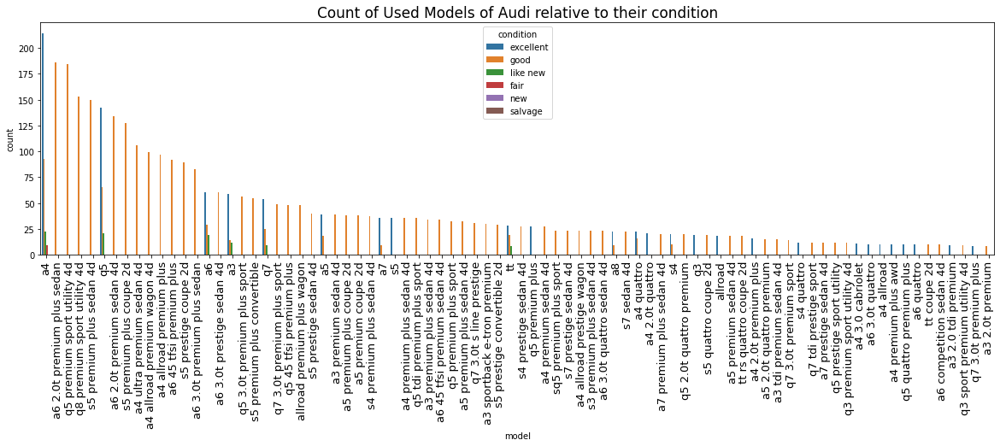

In [48]:
plt.figure(figsize=(20,5))
graph = sns.barplot(y = audi_df['count'].head(100),x = audi_df['model'].head(100),hue=audi_df['condition'])
plt.title("Count of Used Models of Audi relative to their condition",size=17)
k = graph.set_xticklabels(graph.get_xticklabels(),rotation=90,size=13)

BMW

In [49]:
lexus_df = uc[uc['manufacturer'] == 'lexus']
lexus_df = lexus_df['model'].value_counts().reset_index()
lexus_df.columns = ['model','count']
lexus_df.head(5)

,model,count
0,rx 350,562
1,es 350,447
2,ls 460 sedan 4d,335
3,rx,275
4,is,239


Text(0, 0.5, 'No. of Cars')

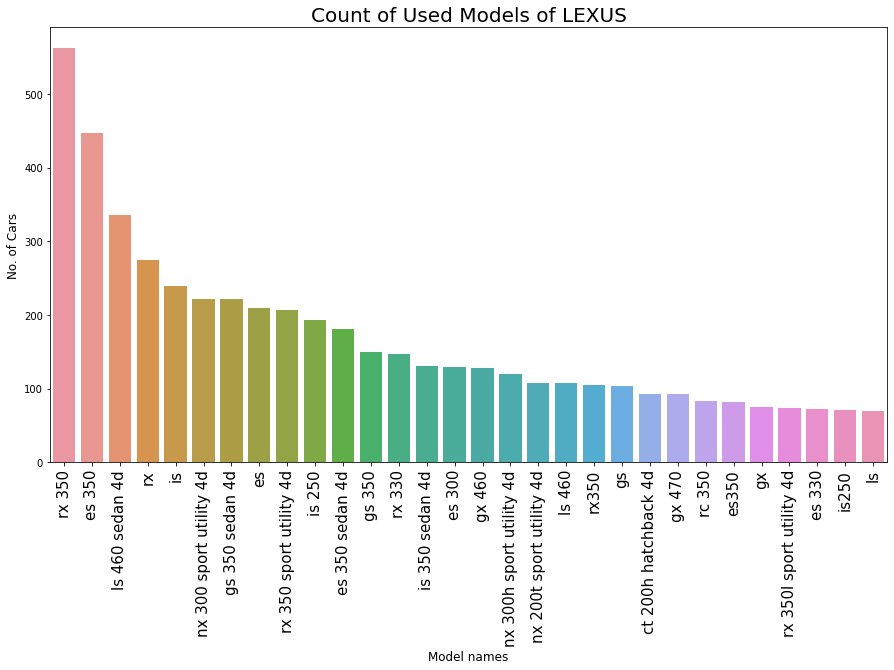

In [50]:
plt.figure(figsize=(15,8))
graph = sns.barplot(y = lexus_df['count'].head(30),x = lexus_df['model'].head(30))
plt.title("Count of Used Models of LEXUS",size=20)
k = graph.set_xticklabels(graph.get_xticklabels(),rotation=90,size=15)
graph.set_xlabel('Model names',size=12)
graph.set_ylabel('No. of Cars',size=12)


Ford

In [51]:
ford_df = uc[uc['manufacturer'] == 'ford']
ford_df = ford_df['model'].value_counts().reset_index()
ford_df.columns = ['model','count']
ford_df.head(5)

,model,count
0,f-150,8009
1,escape,2745
2,explorer,2499
3,mustang,2220
4,fusion,1979


Text(0, 0.5, 'No. of Cars')

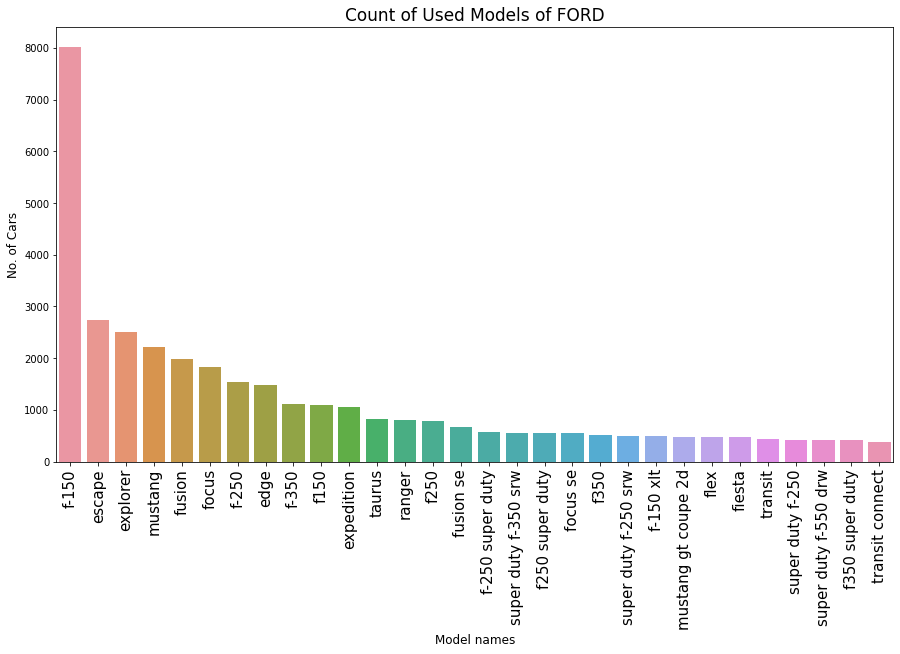

In [52]:
plt.figure(figsize=(15,8))
graph = sns.barplot(y = ford_df['count'].head(30),x = ford_df['model'].head(30))
plt.title("Count of Used Models of FORD",size=17)
k = graph.set_xticklabels(graph.get_xticklabels(),rotation=90,size=15)
graph.set_xlabel('Model names',size=12)
graph.set_ylabel('No. of Cars',size=12)


In [53]:
condition_df = uc.groupby('model')['condition'].value_counts()

In [54]:
condition_df = condition_df.unstack(level = 'condition').fillna(0)

In [55]:
condition_df

condition,excellent,fair,good,like new,new,salvage
model,,,,,,
"""t""",0.0,0.0,0.0,1.0,0.0,0.0
%,0.0,1.0,0.0,0.0,0.0,0.0
& altima,0.0,0.0,1.0,0.0,0.0,0.0
'50 Business Coupe,1.0,0.0,0.0,0.0,0.0,0.0
'99 H1 Hummer,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...
♦ALL TADES WELCOME!♦,2.0,0.0,0.0,0.0,0.0,0.0
♿,1.0,0.0,0.0,0.0,0.0,0.0
♿ vmi,2.0,0.0,0.0,0.0,0.0,0.0


# Price analysis of Cars

In [56]:
price_df = uc.groupby(['manufacturer','model'])['price'].mean()
price_df

manufacturer  model                         
acura         2002 rsx type s                    7900.000000
              3.0cl                              1766.666667
              3.2 cl type s                      8389.400000
              3.2 tl                             4542.800000
              3.2 tl - sport                      150.000000
                                                    ...     
volvo         xc90 t8 inscription 1300 miles    70998.000000
              xc90 v8                            7931.666667
              xc90 v8 awd                        2950.000000
              xc90 v8 awdsuv                     6400.000000
              xc90t6 awd 24733 miles            42864.466667
Name: price, Length: 24169, dtype: float64

In [58]:
audi_price = price_df.loc['audi'].reset_index()
audi_price = audi_price.sort_values(by='price',ascending=False)
audi_price.head(10)

,model,price
516,r8 v10 plus,160000.0
527,rs 6 4.0t quattro avant,159995.0
515,r8 v10 coupe quattro,133995.0
606,s8 4.0t twin turbo,129900.0
607,s8 4.0t twin turbo v8 quattro awd like new,129900.0
513,r8 5.2l,119900.0
518,r8 v10 quattro spyder,106000.0
514,r8 v10,101450.0
519,r8 v10 spyder,95000.0
512,"r8 4.2**v8,4.2l*navi*cam*w",89337.0


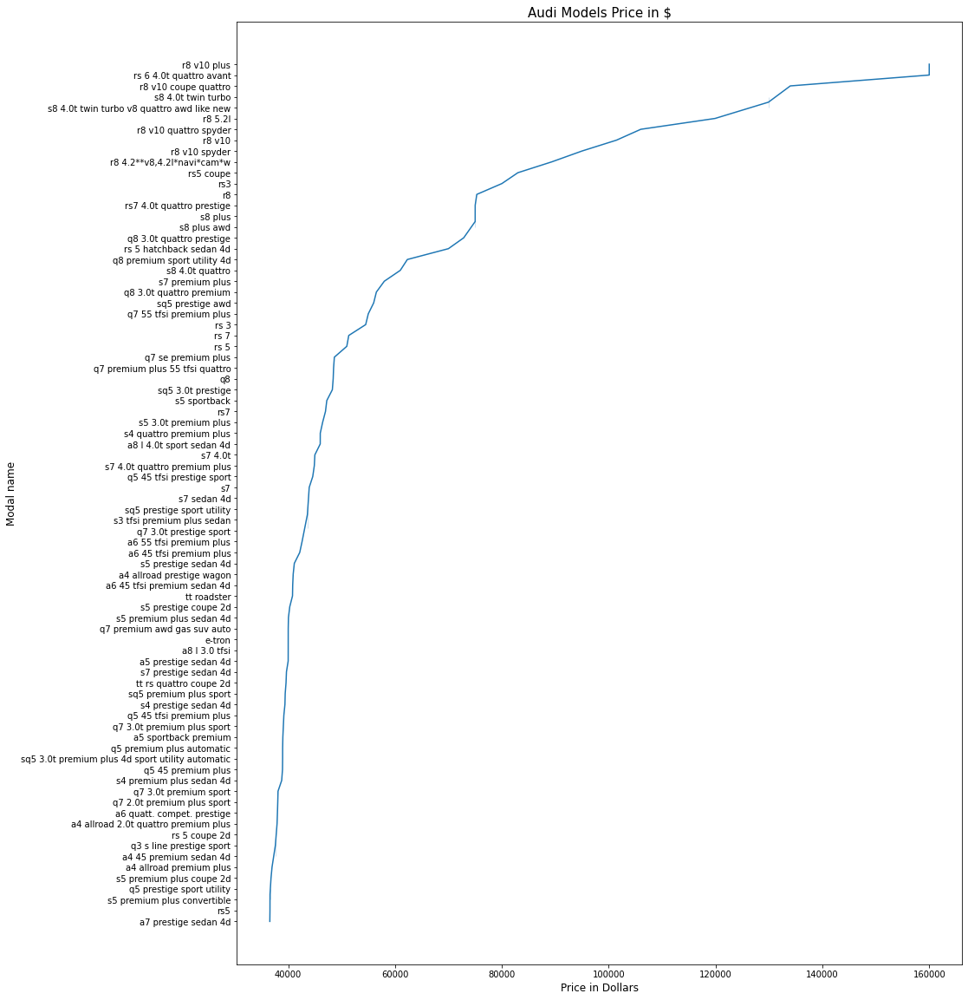

In [59]:
plt.figure(figsize=(15,20))
graph = sns.lineplot(y = 'model',x='price',data = audi_price.head(80))
plt.title('Audi Models Price in $',size=15)
#k = graph.set_xticklabels(graph.get_xticklabels(),rotation=90,size=15)
graph.set_xlabel('Price in Dollars',size=12)
graph.set_ylabel('Modal name',size=12)
plt.savefig('Audi models price')

In [60]:
ford_price = price_df.loc['ford'].reset_index()
ford_price = ford_price.sort_values(by='price',ascending=False)
ford_price['price'] = ford_price['price']//1000
ford_price.head(10)

,model,price
2429,f350 super duty lariat,9149.0
3843,vickey copy,213.0
19,2 dr victoria,213.0
3272,ranger,132.0
1777,f-450 platinum,112.0
1848,f-750 rollback,110.0
990,f 150 raptor shelby baja,109.0
1237,f-150 shelby edition,99.0
1789,f-450 super duty lariat 4,97.0
1626,f-350 f350 f-350 super duty,93.0


Text(0, 0.5, 'Modal name')

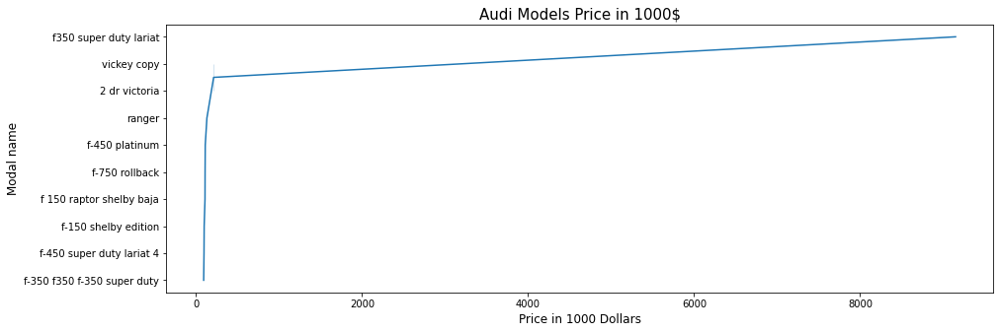

In [61]:
plt.figure(figsize=(15,5))
graph = sns.lineplot(y = 'model',x='price',data = ford_price.head(10))
plt.title('Audi Models Price in 1000$',size=15)
#k = graph.set_xticklabels(graph.get_xticklabels(),rotation=90,size=15)
graph.set_xlabel('Price in 1000 Dollars',size=12)
graph.set_ylabel('Modal name',size=12)

In [62]:
statewise = uc[uc['manufacturer'] == 'mercedes-benz']
statewise = uc.groupby('manufacturer')['state'].value_counts()
statewise

manufacturer  state
acura         ca       772
              fl       369
              ny       311
              oh       298
              tx       283
                      ... 
volvo         wv         6
              ne         4
              ut         3
              wy         3
              nd         2
Name: state, Length: 1926, dtype: int64

In [63]:
statewise = statewise.unstack(level = 'state').fillna(0)

In [64]:
statewise.head(10)

state,ak,al,ar,az,ca,co,ct,dc,de,fl,...,sd,tn,tx,ut,va,vt,wa,wi,wv,wy
manufacturer,,,,,,,,,,,,,,,,,,,,,
acura,20.0,145.0,55.0,111.0,772.0,141.0,84.0,61.0,23.0,369.0,...,2.0,174.0,283.0,7.0,192.0,18.0,124.0,132.0,16.0,5.0
alfa-romeo,2.0,28.0,11.0,19.0,120.0,21.0,10.0,5.0,5.0,40.0,...,2.0,25.0,55.0,0.0,36.0,0.0,4.0,35.0,7.0,6.0
aston-martin,0.0,0.0,0.0,0.0,4.0,1.0,1.0,0.0,0.0,6.0,...,0.0,1.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0
audi,37.0,76.0,54.0,132.0,910.0,231.0,144.0,76.0,15.0,473.0,...,5.0,171.0,338.0,9.0,197.0,38.0,218.0,248.0,18.0,8.0
bmw,118.0,122.0,83.0,247.0,2154.0,307.0,165.0,170.0,27.0,1321.0,...,29.0,289.0,666.0,17.0,456.0,70.0,525.0,577.0,57.0,15.0
buick,32.0,74.0,52.0,114.0,348.0,125.0,63.0,25.0,11.0,248.0,...,21.0,163.0,250.0,9.0,133.0,11.0,77.0,220.0,14.0,3.0
cadillac,31.0,89.0,59.0,167.0,679.0,129.0,71.0,43.0,10.0,629.0,...,8.0,179.0,349.0,10.0,208.0,18.0,142.0,219.0,11.0,9.0
chevrolet,557.0,632.0,774.0,1242.0,5607.0,1193.0,533.0,234.0,145.0,3024.0,...,250.0,1318.0,3133.0,136.0,1245.0,241.0,1516.0,1806.0,158.0,79.0
chrysler,53.0,60.0,71.0,125.0,499.0,120.0,47.0,43.0,12.0,459.0,...,33.0,146.0,279.0,21.0,109.0,17.0,129.0,179.0,3.0,8.0


In [65]:
statewise.describe()

state,ak,al,ar,az,ca,co,ct,dc,de,fl,...,sd,tn,tx,ut,va,vt,wa,wi,wv,wy
count,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,...,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000,42.000000
mean,80.928571,111.047619,92.619048,197.571429,1156.166667,252.523810,114.476190,68.380952,21.380952,646.333333,...,29.428571,253.404762,522.047619,25.714286,247.095238,56.857143,322.309524,259.785714,23.619048,13.619048
std,130.132464,174.037556,160.890654,295.111400,1591.124406,360.896393,147.909537,85.639332,35.258593,945.111548,...,60.734184,387.820619,850.651886,45.047014,361.559347,86.867595,498.111775,397.957746,43.117510,24.649694
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,6.500000,9.750000,11.000000,31.000000,129.500000,24.500000,21.500000,10.000000,3.000000,98.250000,...,2.000000,21.250000,61.250000,3.000000,33.000000,2.000000,30.250000,48.250000,3.000000,1.000000
50%,31.500000,56.500000,41.000000,112.000000,571.000000,122.500000,62.500000,43.000000,10.500000,343.000000,...,7.500000,151.000000,263.000000,8.500000,115.500000,18.000000,126.500000,124.500000,11.000000,5.000000
75%,116.750000,120.000000,80.000000,236.000000,1484.250000,273.000000,142.000000,75.250000,25.000000,865.750000,...,20.250000,307.750000,578.000000,21.750000,289.750000,59.000000,422.250000,266.750000,18.750000,14.250000
max,594.000000,905.000000,774.000000,1348.000000,7189.000000,1706.000000,685.000000,328.000000,177.000000,5033.000000,...,288.000000,2047.000000,4456.000000,235.000000,1788.000000,369.000000,2403.000000,1865.000000,229.000000,127.000000


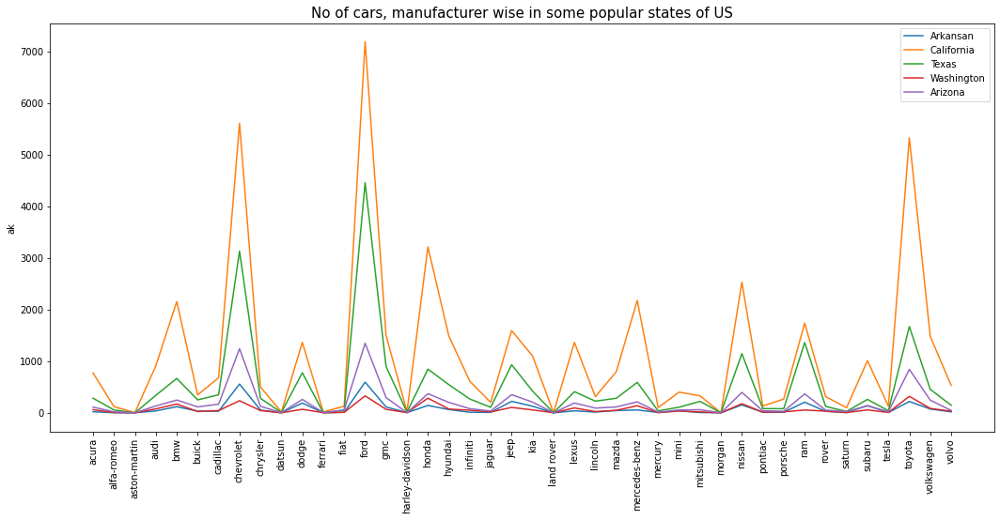

<Figure size 432x288 with 0 Axes>

In [66]:
plt.figure(figsize = (18,8))
brand = list(statewise.index)
sns.lineplot(x =brand,y = statewise['ak'],label = 'Arkansan')
sns.lineplot(x = brand,y = statewise['ca'],label = 'California')
sns.lineplot(x = brand,y = statewise['tx'],label = 'Texas')
sns.lineplot(x = brand,y = statewise['dc'],label = 'Washington')
sns.lineplot(x = brand,y = statewise['az'],label = 'Arizona')

plt.title("No of cars, manufacturer wise in some popular states of US",size=15)
plt.xticks(label = 'Brand Name',rotation=90)
plt.yticks(label = 'No. of cars')
plt.legend()
plt.show()
plt.savefig('No of cars manufacturer wise in some popular states')

In [71]:
px.line(x = statewise.index,y = statewise['ca'])